# Waste Segregation Management: Waste Classifier

This notebook builds an end to end multi class image classifier using Tensorflow 2.0 and Tensorflow Hub.

## 1. Problem

Identifying the type of waste thrown in for the WSM Project.  

## 2. Data

The data we are using is from Kaggle.

https://www.kaggle.com/techsash/waste-classification-data

## 3. Evaluation

There are multiple evaluation metrics for a Classification model, what we will be doing is to focus majorly on Accuracy and predict the right Probabilities. We will also pay heed to recall values and other metrics.

## 4. Features

Info about the data:
* We have images (unstructured data).
* There are major 2 classifications organic and recyclable We might add a 3rd one named Trash.
* The first model will be built on that classification schema and then we can upadate it for further classifying paper, plastic, metal and other waste categories.

###Get workspace ready###
* Import Tensorflow 2.x
* Import Tensorflow Hub
* Make sure we're using a GPU.

In [57]:
# Importing the tools
import tensorflow as tf
import tensorflow_hub as hub
import cv2
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Checking GPU availability
print("GPU", "YESSSS!!!" if tf.config.list_physical_devices("GPU") else "NOO")

TF version: 2.2.0
TF Hub version: 0.8.0
GPU YESSSS!!!


###Getting our data ready. 
Turning images into Tensors.

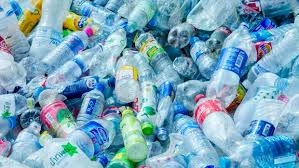

In [58]:
# Lets view an image for our understanding in the NoteBook.   
from IPython.display import Image
Image("drive/My Drive/TRAIN/R_1012.jpg")


In [59]:
# Creating and checking the csv for the images in the TRAIN set.
import pandas as pd
import numpy as np
labels_csv = pd.read_csv("drive/My Drive/labels.csv")
labels_csv

,file_name,waste_type
0,O_11829,O
1,O_1173,O
2,O_3740,O
3,R_4083,R
4,O_11211,O
...,...,...
22559,O_8882,O
22560,O_9273,O
22561,O_6080,O
22562,O_9654,O


In [60]:
labels_csv["waste_type"].value_counts()

O    12565
R     9999
Name: waste_type, dtype: int64

In [81]:
# Create a pathname from file_name.
filenames = ["drive/My Drive/TRAIN/" + fname +".jpg" for fname in labels_csv["file_name"]]

#Lets check
filenames[13000:13010]

['drive/My Drive/TRAIN/O_12326.jpg',
 'drive/My Drive/TRAIN/O_8229.jpg',
 'drive/My Drive/TRAIN/O_11257.jpg',
 'drive/My Drive/TRAIN/O_7486.jpg',
 'drive/My Drive/TRAIN/R_6612.jpg',
 'drive/My Drive/TRAIN/O_3088.jpg',
 'drive/My Drive/TRAIN/R_855.jpg',
 'drive/My Drive/TRAIN/O_12186.jpg',
 'drive/My Drive/TRAIN/O_12064.jpg',
 'drive/My Drive/TRAIN/R_4926.jpg']

In [82]:
import numpy as np
labels = labels_csv["waste_type"]
labels = np.array(labels)
labels

array(['O', 'O', 'O', ..., 'O', 'O', 'O'], dtype=object)

In [83]:
len(labels)

22564

In [84]:
len(filenames)

22564

In [85]:
waste_types = np.array(['O', 'R'])
waste_types

array(['O', 'R'], dtype='<U1')

In [86]:
labels[0] == waste_types

array([ True, False])

In [87]:
# Turn every label into a boolean array 
boolean_labels = [label == waste_types for label in labels]


In [88]:
len(boolean_labels)

22564

In [89]:
# Tuning boolean array into integers
print(labels[0])
print(np.where(waste_types == labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

O
(array([0]),)
0
[1 0]


In [90]:
boolean_labels[:10]

[array([ True, False]),
 array([ True, False]),
 array([ True, False]),
 array([False,  True]),
 array([ True, False]),
 array([ True, False]),
 array([False,  True]),
 array([False,  True]),
 array([False,  True]),
 array([False,  True])]

### Creating our own Validation set

In [92]:
# Setup X and Y variables.
X = filenames
Y = boolean_labels

We will start with ~1000 images and proceed further. 

In [93]:
# Set number of images to use
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:100}

In [94]:
# Split the data
from sklearn.model_selection import train_test_split

X_train, X_val, Y_train, Y_val = train_test_split(X[:NUM_IMAGES],
                                                  Y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=100)
len(X_train), len(Y_train), len(X_val), len(Y_val)

(800, 800, 200, 200)

In [95]:
X_train[:5], Y_train[:5]

(['drive/My Drive/TRAIN/R_1474.jpg',
  'drive/My Drive/TRAIN/R_9572.jpg',
  'drive/My Drive/TRAIN/O_1833.jpg',
  'drive/My Drive/TRAIN/O_3103.jpg',
  'drive/My Drive/TRAIN/R_6066.jpg'],
 [array([False,  True]),
  array([False,  True]),
  array([ True, False]),
  array([ True, False]),
  array([False,  True])])

In [98]:
X_train[755:800]

['drive/My Drive/TRAIN/O_2938.jpg',
 'drive/My Drive/TRAIN/O_5470.jpg',
 'drive/My Drive/TRAIN/R_6234.jpg',
 'drive/My Drive/TRAIN/R_907.jpg',
 'drive/My Drive/TRAIN/O_6311.jpg',
 'drive/My Drive/TRAIN/O_5881.jpg',
 'drive/My Drive/TRAIN/O_11211.jpg',
 'drive/My Drive/TRAIN/R_5542.jpg',
 'drive/My Drive/TRAIN/O_12098.jpg',
 'drive/My Drive/TRAIN/O_10817.jpg',
 'drive/My Drive/TRAIN/R_2754.jpg',
 'drive/My Drive/TRAIN/O_4845.jpg',
 'drive/My Drive/TRAIN/R_513.jpg',
 'drive/My Drive/TRAIN/R_2899.jpg',
 'drive/My Drive/TRAIN/R_7540.jpg',
 'drive/My Drive/TRAIN/O_4073.jpg',
 'drive/My Drive/TRAIN/R_4980.jpg',
 'drive/My Drive/TRAIN/O_8736.jpg',
 'drive/My Drive/TRAIN/O_10036.jpg',
 'drive/My Drive/TRAIN/O_2040.jpg',
 'drive/My Drive/TRAIN/R_1141.jpg',
 'drive/My Drive/TRAIN/R_6964.jpg',
 'drive/My Drive/TRAIN/R_3351.jpg',
 'drive/My Drive/TRAIN/O_2805.jpg',
 'drive/My Drive/TRAIN/O_5685.jpg',
 'drive/My Drive/TRAIN/O_3664.jpg',
 'drive/My Drive/TRAIN/O_1688.jpg',
 'drive/My Drive/TRAIN/R_9

## Preprocessing images (turning images into Tensors)

1. Take filepath as input
2. Use tensorflow to save the image into a var.
3. Turn our image into Tensors.
4. Resize the image to be a shape of (224, 224)
5. Return the image.



In [112]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[72])
image.shape


(225, 225, 3)

In [114]:
# turn image into tensor
tf.constant(image)

<tf.Tensor: shape=(225, 225, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 25

In [117]:
# Define image size
IMG_SIZE = 224

# Function for preprocessing images
def process_image(image_path):
  # Read in an image file
  image = tf.io.read_file(image_path)
  
  # Jpeg image into Tensor
  image = tf.image.decode_jpeg(image, channels=3)

  # Convert the color channel values from 0-255 to 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our specified method.
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image 

## Turning our data into batches

1. Yann LeCun
2. Its easy to implement a model on a small data sample size. Then replicate it.
3. Convention is of 32 batch size, we can change it.
4. Tensor Tuples.
 `(image, label)`

In [118]:
# Function for returning a Tensor tuple

def get_image_label(image_path, label):
  
  image = process_image(image_path)
  return image, label

In [119]:
process_image(X[21]), tf.constant(Y[21])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[1.        , 1.        , 0.9921569 ],
         [1.        , 1.        , 0.9921569 ],
         [0.9941702 , 0.99708515, 0.98049724],
         ...,
         [0.97949046, 0.9941701 , 0.99125516],
         [0.98944324, 1.        , 1.        ],
         [0.9960785 , 1.        , 1.        ]],
 
        [[1.        , 1.        , 0.9921569 ],
         [1.        , 1.        , 0.9921569 ],
         [0.9941702 , 0.99708515, 0.98049724],
         ...,
         [0.97949046, 0.9941701 , 0.99125516],
         [0.98944324, 1.        , 1.        ],
         [0.9960785 , 1.        , 1.        ]],
 
        [[1.        , 1.        , 0.9921569 ],
         [1.        , 1.        , 0.9921569 ],
         [0.9941702 , 0.99708515, 0.98049724],
         ...,
         [0.97949046, 0.9941701 , 0.99125516],
         [0.98944324, 1.        , 1.        ],
         [0.9960785 , 1.        , 1.        ]],
 
        ...,
 
        [[0.9933386 , 1.        

We have Tensor Tuples now, of form
`(image, label)`
Function to convert all data in `X` and `Y` into batches

In [120]:
# Define the batch size
BATCH_SIZE = 32

#Function to turn data into batches
def create_data_batches(X, Y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """ 
  Creates the batches out of X and Y
  Shuffles the data for training but not for validation
  Also takes test data
  
  """
  #for_test_data
  if test_data:
    print("Creating Test Data Batches..")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) #only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  #for_valid_data
  elif valid_data:
    print("Creating Valid Data Batches..")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(Y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating Train Data Batches..")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(Y)))
    #Shuffling pathnames and labels before mapping
    data = data.shuffle(buffer_size=len(X))

    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  

In [121]:
# Create a training and valid data batches
train_data = create_data_batches(X_train, Y_train)
val_data = create_data_batches(X_val, Y_val, valid_data=True)

Creating Train Data Batches..
Creating Valid Data Batches..


In [124]:
# Check out the attr of data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 2), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 2), dtype=tf.bool, name=None)))

### Visualizing these batches

Lets Visualize these batches for our betterment.

In [128]:
import matplotlib.pyplot as plt

#Create a function for viewing images in a batch
def show_images(images, labels):
  #Setup the figure
  plt.figure(figsize=(10, 10))

  for i in range(25):
    # 5 rows 5 cols
    ax = plt.subplot(5, 5, i+1)
    #Display the image
    plt.imshow(images[i])
    # Add the image label
    plt.title(waste_types[labels[i].argmax()])
    plt.axis("off")



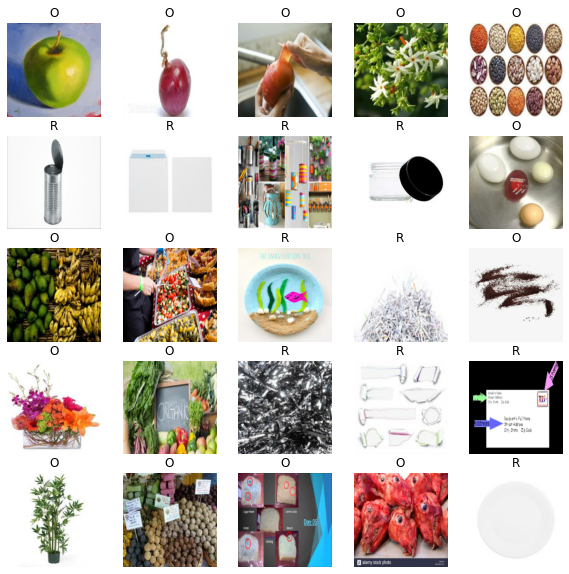

In [131]:
# Lets Visualize it
train_images, train_labels = next(train_data.as_numpy_iterator())
show_images(train_images, train_labels)

## Building a model
* The input shape
* The output shape
* The URL for the model from TFHub.



In [132]:
#Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

#Setup Output shape
OUTPUT_SHAPE = len(waste_types)

# Setup model URL from TF-Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"


Lets put them all together into a Keras deep learning model

We will make a func
* Parameters: Imput shape, Output shape, Model type
* Defines the layers in Keras
* Compiles the model
* Builds the Model
* Returns the Model

Read more at tfhub.dev

In [137]:
# Func for Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Making a Keras Model with:", MODEL_URL)

  #Setup Layers
  model = tf.keras.Sequential([
           hub.KerasLayer(MODEL_URL), #Layer 1
           tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                 activation="sigmoid") #Layer2 #softmax
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.BinaryCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"] 
  )

  #Build the model
  model.build(INPUT_SHAPE)

  return model



In [138]:
model = create_model()
model.summary()

Making a Keras Model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer_2 (KerasLayer)   multiple                  5432713   
_________________________________________________________________
dense_2 (Dense)              multiple                  2004      
Total params: 5,434,717
Trainable params: 2,004
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating call backs
Callbacks help us to save a model's progress, and stop training if model stops improving. 


### TensorBoard Callback
Tensorflow's inbuilt tool to track the progress visually.

In [142]:
# Load the TensorBoard notebook extension

%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [143]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/logs",
                        # logs get tracked whenever it runs.
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback
Early stopping helps prevent overfitting by stopping a model when a certain evaluation metric stops improving. If a model trains for too long, it can do so well at finding patterns in a certain dataset that it's not able to use those patterns on another dataset it hasn't seen before (doesn't generalize).

In [144]:
# Create early stopping (once our model stops improving, stop training)

early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) # stops after 3 rounds of no improvements

## Training a Model (on the subset)
first model is only going to be trained on 1000 images. Or trained on 800 images and then validated on 200 images, meaning 1000 images total or about 5% of the total data.

The final parameter we'll define before training is NUM_EPOCHS (also known as number of epochs).

NUM_EPOCHS defines how many passes of the data we'd like our model to do. A pass is equivalent to our model trying to find patterns in each image and see which patterns relate to each label.

In [145]:
# Checking GPU availability again.
print("GPU", "YESSSS!!!" if tf.config.list_physical_devices("GPU") else "NOO")

GPU YESSSS!!!


In [146]:
# How many rounds should we get the model to look through the data?
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

Let's create a simple function which trains a model. The function will:

1. Create a model using create_model().
2. Setup a TensorBoard callback using create_tensorboard_callback().
3. Call the fit() function on our model passing it the training data, validatation data, number of epochs to train for and the callbacks we'd like to use.
4. Return the fitted model.

In [147]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, # check validation metrics every epoch
            callbacks=[tensorboard, early_stopping])
  
  return model

In [148]:
# Fit the model to the data
model = train_model()

Making a Keras Model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 676s 27s/step - loss: 0.5630 - accuracy: 0.7775 - val_loss: 0.3014 - val_accuracy: 0.9150
Epoch 2/100
25/25 [==============================] - 5s 205ms/step - loss: 0.3045 - accuracy: 0.8925 - val_loss: 0.2413 - val_accuracy: 0.9250
Epoch 3/100
25/25 [==============================] - 5s 203ms/step - loss: 0.2392 - accuracy: 0.9187 - val_loss: 0.2196 - val_accuracy: 0.9300
Epoch 4/100
25/25 [==============================] - 5s 204ms/step - loss: 0.1998 - accuracy: 0.9287 - val_loss: 0.2099 - val_accuracy: 0.9400
Epoch 5/100
25/25 [==============================] - 5s 203ms/step - loss: 0.1756 - accuracy: 0.9425 - val_loss: 0.2010 - val_accuracy: 0.9400
Epoch 6/100
25/25 [==============================] - 5s 204ms/step - loss: 0.1548 - accuracy: 0.9450 - val_loss: 0.1950 - val_accuracy: 0.9400
Epoch 7/100
25/25 [========================

#### Checking the TensorBoard logs

The TensorBoard function (`%tensorboard`) will access the logs directory we created earlier and viualize its contents.

In [149]:
%tensorboard --logdir drive/My\ Drive/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

Before we scale up and train on more data, let's see some other ways we can evaluate our model. 

Making predictions with a trained model is as calling `predict()` on it and passing it data in the same format the model was trained on.

In [150]:
# Make predictions on the validation data
predictions = model.predict(val_data, verbose=1) # verbose shows us how long there is to go
predictions

7/7 [==============================] - 1s 124ms/step


array([[7.81659130e-03, 9.89492893e-01],
       [9.92992282e-01, 4.83398006e-04],
       [6.28221333e-02, 9.81887877e-01],
       [7.51737297e-01, 3.28081727e-01],
       [9.99242067e-01, 1.20169390e-03],
       [5.27700456e-03, 9.62731838e-01],
       [9.92939949e-01, 5.68431150e-03],
       [4.53049596e-03, 9.91489172e-01],
       [1.75842702e-01, 7.23665297e-01],
       [9.99702871e-01, 5.85719354e-05],
       [9.98052239e-01, 1.28689350e-03],
       [4.88674611e-01, 6.43658876e-01],
       [9.61637020e-01, 3.22792768e-01],
       [9.93924081e-01, 4.36446397e-03],
       [2.25366056e-01, 8.73258829e-01],
       [1.53014529e-02, 9.58784103e-01],
       [9.98048067e-01, 1.99946738e-03],
       [8.10832158e-03, 9.72720921e-01],
       [9.99954224e-01, 9.86893865e-05],
       [1.09968930e-01, 9.22094822e-01],
       [9.94388759e-01, 1.34474644e-03],
       [1.22239605e-01, 9.78272915e-01],
       [7.49863803e-01, 2.26838812e-01],
       [2.60801837e-02, 9.91159618e-01],
       [1.549406

In [151]:
# Check the shape of predictions
predictions.shape

(200, 2)

In [152]:
# First prediction
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[0])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[0])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {waste_types[np.argmax(predictions[0])]}") # the predicted label

[0.00781659 0.9894929 ]
Max value (probability of prediction): 0.9894928932189941
Sum: 0.9973095059394836
Max index: 1
Predicted label: R


In [153]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return waste_types[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'R'

Since our validation data (val_data) is in batch form, to get a list of validation images and labels, we'll have to unbatch it (using unbatch()) and then turn it into an iterator using as_numpy_iterator().

Let's make a small function to do so.

In [154]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(waste_types[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[1.       , 1.       , 1.       ],
         [1.       , 1.       , 1.       ],
         [1.       , 1.       , 1.       ],
         ...,
         [1.       , 1.       , 1.       ],
         [1.       , 1.       , 1.       ],
         [1.       , 1.       , 1.       ]],
 
        [[1.       , 1.       , 1.       ],
         [1.       , 1.       , 1.       ],
         [1.       , 1.       , 1.       ],
         ...,
         [1.       , 1.       , 1.       ],
         [1.       , 1.       , 1.       ],
         [1.       , 1.       , 1.       ]],
 
        [[1.       , 1.       , 1.       ],
         [1.       , 1.       , 1.       ],
         [1.       , 1.       , 1.       ],
         ...,
         [1.       , 1.       , 1.       ],
         [1.       , 1.       , 1.       ],
         [1.       , 1.       , 1.       ]],
 
        ...,
 
        [[0.9596027, 0.9596027, 0.9596027],
         [0.9596027, 0.9596027, 0.9596027],
         [0.9596027, 0.9596027, 0.9596027],
         .

* More Visualization to understand better 

In [155]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  
  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  
  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

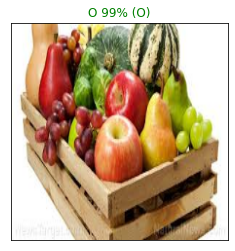

In [156]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

In [157]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = waste_types[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), 
                     top_10_pred_values, 
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

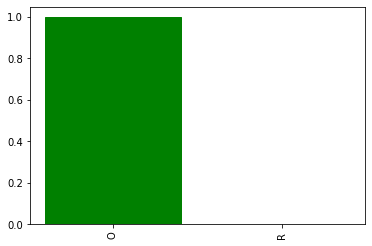

In [158]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

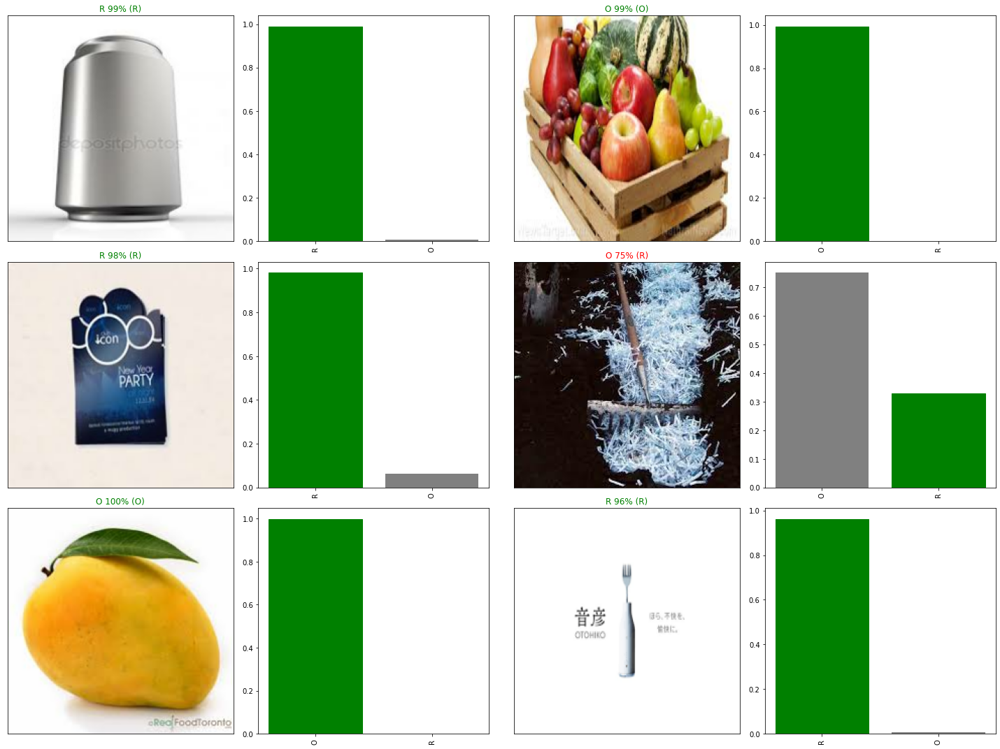

In [159]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a model

The Guru Mantra: Train it then Save it.

The format of an [entire saved Keras model is h5](https://www.tensorflow.org/tutorials/keras/save_and_load). 
So we'll make a function which can take a model as input and utilise the [`save()`](https://www.tensorflow.org/tutorials/keras/save_and_load#savedmodel_format) method to save it as a h5 file to a specified directory.

In [165]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("drive/My Drive/",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [166]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [167]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-Adam")

Saving model to: drive/My Drive/20200705-15301593963030-1000-images-Adam.h5...


'drive/My Drive/20200705-15301593963030-1000-images-Adam.h5'

In [168]:
# Load our model trained on 1000 images
model_1000_images = load_model('drive/My Drive/20200705-15301593963030-1000-images-Adam.h5')

Loading saved model from: drive/My Drive/20200705-15301593963030-1000-images-Adam.h5


In [169]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 122ms/step - loss: 0.1820 - accuracy: 0.9400


[0.18195335566997528, 0.9399999976158142]

In [170]:
# Evaluate the loaded model
model_1000_images.evaluate(val_data)

7/7 [==============================] - 1s 120ms/step - loss: 0.1820 - accuracy: 0.9400


[0.18195335566997528, 0.9399999976158142]

## Training a model (on the full data)

 our model works on a subset of the data, we can start to move forward with training one on the full data.

Above, we saved all of the training filepaths to `X` and all of the training labels to `Y`. 

In [171]:
# Remind ourselves of the size of the full dataset
len(X), len(Y)

(22564, 22564)

In [172]:
# Turn full training data in a data batch
full_data = create_data_batches(X, Y)

Creating Train Data Batches..


In [173]:
# Instantiate a new model for training on the full dataset
full_model = create_model()

Making a Keras Model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [174]:
# Create full model callbacks

# TensorBoard callback
full_model_tensorboard = create_tensorboard_callback()

# Early stopping callback
# Note: No validation set when training on all the data, therefore can't monitor validation accruacy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [175]:
%tensorboard --logdir drive/My\ Drive/logs

Reusing TensorBoard on port 6006 (pid 6506), started 0:15:21 ago. (Use '!kill 6506' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
# Fit the full model to the full training data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, 
                          full_model_early_stopping])

Epoch 1/100
102/706 [===>..........................] - ETA: 4:02:15 - loss: 0.3508 - accuracy: 0.8778

### Saving and reloading the full model

Lets Save the full trained model
Using `save_model()` function.

In [ ]:
# Save model to file
save_model(full_model, suffix="all-images-Adam")

# Load in the full model
loaded_full_model = load_model('drive/My Drive/Data/models/20200131-03111580440309-all-images-Adam.h5')